In [9]:
!which python
!python --version

/home/green/ENV3/bin/python
Python 3.10.8


In [3]:
!pip install h5py
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install astral
!pip install plotly
!pip install eumdac
!pip install requests
!pip install folium
!pip install cloudmesh-common
!pip install selenium
!pip install tqdm
!pip install geopandas
!pip install cartopy

In [1]:
import numpy as np
import os
from pprint import pprint
from datetime import timedelta
from datetime import datetime

import eumdac
import requests
import shutil
from cloudmesh.common.util import readfile
from cloudmesh.common.util import banner

import geopandas as gpd
from cloudmesh.common.systeminfo import os_is_windows
from cloudmesh.common.systeminfo import os_is_mac
from cloudmesh.common.systeminfo import os_is_linux
from cloudmesh.common.console import Console
from cloudmesh.common.Shell import Shell
from cloudmesh.common.util import writefile
from satellite import Sentinel
import environment


# ----------------------------------------------------------------------
# ENVIRONMENT
# ----------------------------------------------------------------------

target         : gregor-linux
BASE           : /scratch
DATA_DIR       : /nfs/flash/mlcommons/data
PROJECT_SRC    : /scratch/mlcommons/src
PROJECT        : /scratch/mlcommons/src/mlcommons
ESAT           : ~/.esat
Checking Credentials
    ~/.esat/consumer-key exists True
    ~/.esat/consumer-secret exists True
The esat credentials already exist
DATA_DIR /nfs/flash/mlcommons/data
['/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191001T113221_20191001T113521_20191002T153211_0179_050_023_1980_LN2_O_NT_003.hdf',
 '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191002T124409_20191002T124709_20191003T180638_0180_050_038_1800_LN2_O_NT_003.hdf',
 '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191002T124709_20191002T125009_20191003T180806_0179_050_038_1980_LN2_O_NT_003.hdf',
 '/nfs/flash/mlcommons/data/ssts/day/S3A_S

In [2]:
import environment


# ---------------------------------------------------------------------------
# SET UP ESAT API KEY
# ---------------------------------------------------------------------------

To get the token please optein the API keys for consumer-key and secret-key by
executing the next line and copy them to the directory ~/.esat in the
appropriate files


In [3]:
from satellite import Sentinel
sentinel = Sentinel()

sentinel.credentials()
token = sentinel.token()



Checking Credentials
    ~/.esat/consumer-key exists True
    ~/.esat/consumer-secret exists True
The esat credentials already exist
This token 'd377a108-2d39-3235-bfe1-0c7fccce9b3c' expires 2023-12-12 13:59:36.434709. This is in 5 minutes from now.


In [4]:
def save_plot(plt, file_name, dpi=300):
    plt.savefig(f"{file_name}.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{file_name}.png", format='png', dpi=dpi, bbox_inches='tight')

In [5]:
DATA_DIR = environment.DATA_DIR

data_path1 = f'{DATA_DIR}/ssts/day'
data_path2 = f'{DATA_DIR}/ssts/night'

def get_filenames_in_directory(directory_path):
    items = os.listdir(directory_path)
    filenames = [item for item in items if os.path.isfile(os.path.join(directory_path, item))]

    return filenames

def get_filenames_and_absolute_paths(directory_path):
    # List all items in the directory
    items = os.listdir(directory_path)

    # Filter out directories and get only filenames with absolute paths
    absolute_paths = [os.path.abspath(os.path.join(directory_path, item)) for item in items if os.path.isfile(os.path.join(directory_path, item))]

    return absolute_paths

temp = get_filenames_and_absolute_paths(data_path1) + get_filenames_and_absolute_paths(data_path2)

print (temp)
# print(data_path1)
# print(data_path2)
# print(temp)

['/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191001T113221_20191001T113521_20191002T153211_0179_050_023_1980_LN2_O_NT_003.hdf', '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191002T124409_20191002T124709_20191003T180638_0180_050_038_1800_LN2_O_NT_003.hdf', '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191002T124709_20191002T125009_20191003T180806_0179_050_038_1980_LN2_O_NT_003.hdf', '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191002T125609_20191002T125909_20191003T181226_0179_050_038_2520_LN2_O_NT_003.hdf', '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191003T122059_20191003T122359_20191004T173532_0179_050_052_1980_LN2_O_NT_003.hdf', '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191003T122659_20191003T122959_20191004T173822_0179_050_052_2340_LN2_O_NT_003.hdf', '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191004T114848_20191004T115148_20191005T172918_0179_050_066_1620_LN2_O_NT_003.hdf', '/nfs/flash/mlcommons/data/ssts/day/S3A_

In [6]:
sentinel = Sentinel()
sentinel.credentials()

DATA_DIR = environment.DATA_DIR

print ("DATA_DIR", DATA_DIR)


files = []


def get_filenames(directory_path):
    # List all items in the directory
    items = os.listdir(directory_path)

    # Filter out directories and get only filenames with absolute paths
    absolute_paths = [os.path.abspath(os.path.join(directory_path, item)) for item in items if os.path.isfile(os.path.join(directory_path, item))]

    return absolute_paths

for directory in [f'{DATA_DIR}/ssts/day', f'{DATA_DIR}/ssts/night']:
     dir_files = get_filenames(directory)
     files = files + dir_files

pprint(files)

sentinel.add_files(files)

sentinel.df


Checking Credentials
    ~/.esat/consumer-key exists True
    ~/.esat/consumer-secret exists True
The esat credentials already exist
DATA_DIR /nfs/flash/mlcommons/data
['/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191001T113221_20191001T113521_20191002T153211_0179_050_023_1980_LN2_O_NT_003.hdf',
 '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191002T124409_20191002T124709_20191003T180638_0180_050_038_1800_LN2_O_NT_003.hdf',
 '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191002T124709_20191002T125009_20191003T180806_0179_050_038_1980_LN2_O_NT_003.hdf',
 '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191002T125609_20191002T125909_20191003T181226_0179_050_038_2520_LN2_O_NT_003.hdf',
 '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191003T122059_20191003T122359_20191004T173532_0179_050_052_1980_LN2_O_NT_003.hdf',
 '/nfs/flash/mlcommons/data/ssts/day/S3A_SL_1_RBT____20191003T122659_20191003T122959_20191004T173822_0179_050_052_2340_LN2_O_NT_003.hdf',
 '/n

,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,creation_date,instance_id,center_id,class_id,file_extension,hdf_file
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,/nfs/flash/mlcommons/data/ssts/day/S3A,SL,1,RBT,2019-10-02 15:32:11,0179_050_023_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,/nfs/flash/mlcommons/data/ssts/day/S3A,SL,1,RBT,2019-10-03 18:06:38,0180_050_038_1800,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,/nfs/flash/mlcommons/data/ssts/day/S3A,SL,1,RBT,2019-10-03 18:08:06,0179_050_038_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,/nfs/flash/mlcommons/data/ssts/day/S3A,SL,1,RBT,2019-10-03 18:12:26,0179_050_038_2520,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,/nfs/flash/mlcommons/data/ssts/day/S3A,SL,1,RBT,2019-10-04 17:35:32,0179_050_052_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,/nfs/flash/mlcommons/data/ssts/night/S3A,SL,1,RBT,2019-10-29 01:32:17,0179_051_015_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,/nfs/flash/mlcommons/data/ssts/night/S3A,SL,1,RBT,2019-10-30 05:00:58,0179_051_031_0360,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,/nfs/flash/mlcommons/data/ssts/night/S3A,SL,1,RBT,2019-10-31 01:57:42,0179_051_044_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,/nfs/flash/mlcommons/data/ssts/night/S3A,SL,1,RBT,2019-11-01 02:57:13,0179_051_058_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]"


In [7]:
table = sentinel.export_to_latex()
print(table)


\begin{longtable}{lrlllll}
 & counter & daylight & start_time & stop_time & creation_date & instance_id \\
0 & 1 & day & 2019-10-01 11:32:21 & 2019-10-01 11:35:21 & 2019-10-02 15:32:11 & 0179_050_023_1980 \\
1 & 2 & day & 2019-10-02 12:44:09 & 2019-10-02 12:47:09 & 2019-10-03 18:06:38 & 0180_050_038_1800 \\
2 & 3 & day & 2019-10-02 12:47:09 & 2019-10-02 12:50:09 & 2019-10-03 18:08:06 & 0179_050_038_1980 \\
3 & 4 & day & 2019-10-02 12:56:09 & 2019-10-02 12:59:09 & 2019-10-03 18:12:26 & 0179_050_038_2520 \\
4 & 5 & day & 2019-10-03 12:20:59 & 2019-10-03 12:23:59 & 2019-10-04 17:35:32 & 0179_050_052_1980 \\
5 & 6 & day & 2019-10-03 12:26:59 & 2019-10-03 12:29:59 & 2019-10-04 17:38:22 & 0179_050_052_2340 \\
6 & 7 & day & 2019-10-04 11:48:48 & 2019-10-04 11:51:48 & 2019-10-05 17:29:18 & 0179_050_066_1620 \\
7 & 8 & day & 2019-10-04 11:51:48 & 2019-10-04 11:54:48 & 2019-10-05 17:30:23 & 0179_050_066_1800 \\
8 & 9 & day & 2019-10-04 11:54:48 & 2019-10-04 11:57:48 & 2019-10-05 17:31:29 & 0180_

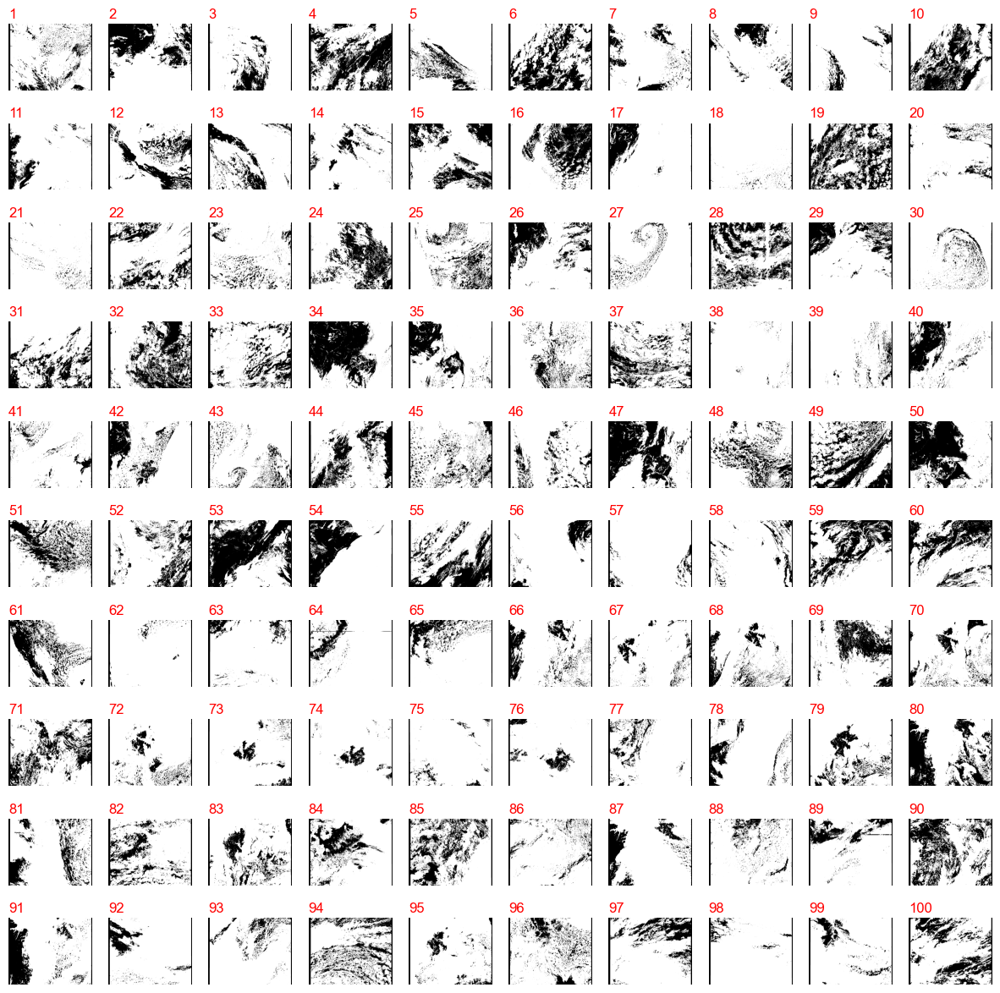

<Figure size 640x480 with 0 Axes>

In [8]:
plt = sentinel.plot_satelite_matrix(size=15, y_offset=-100, fontsize=12)

In [9]:
Shell.mkdir("images")

False

In [10]:
save_plot(plt, "./images/bw-inference-sort-by-counter")

<Figure size 640x480 with 0 Axes>

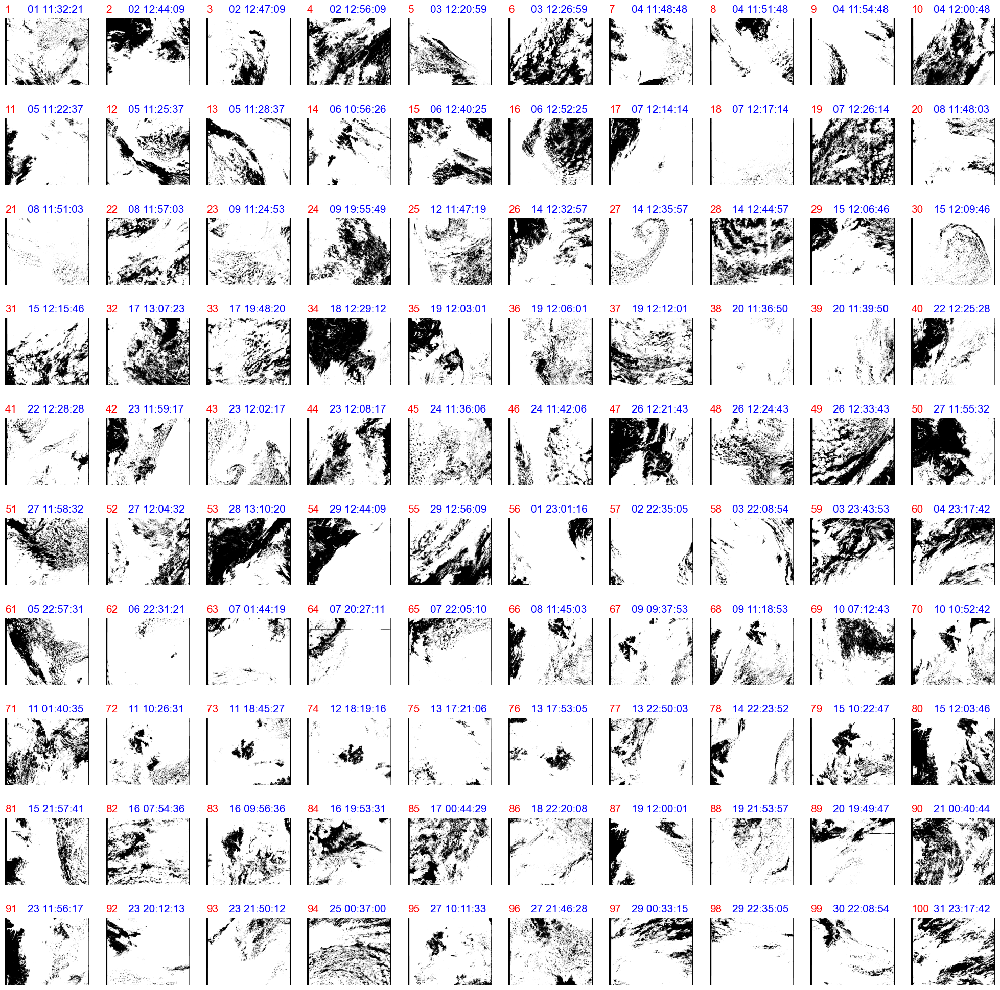

<module 'matplotlib.pyplot' from '/home/green/ENV3/lib/python3.10/site-packages/matplotlib/pyplot.py'>

<Figure size 640x480 with 0 Axes>

In [11]:
sentinel.plot_satelite_matrix(sort_by_time=False, display_time_in_title=True, size=25, fontsize=15, counter_in_title=True, y_offset=-100, dx=400)

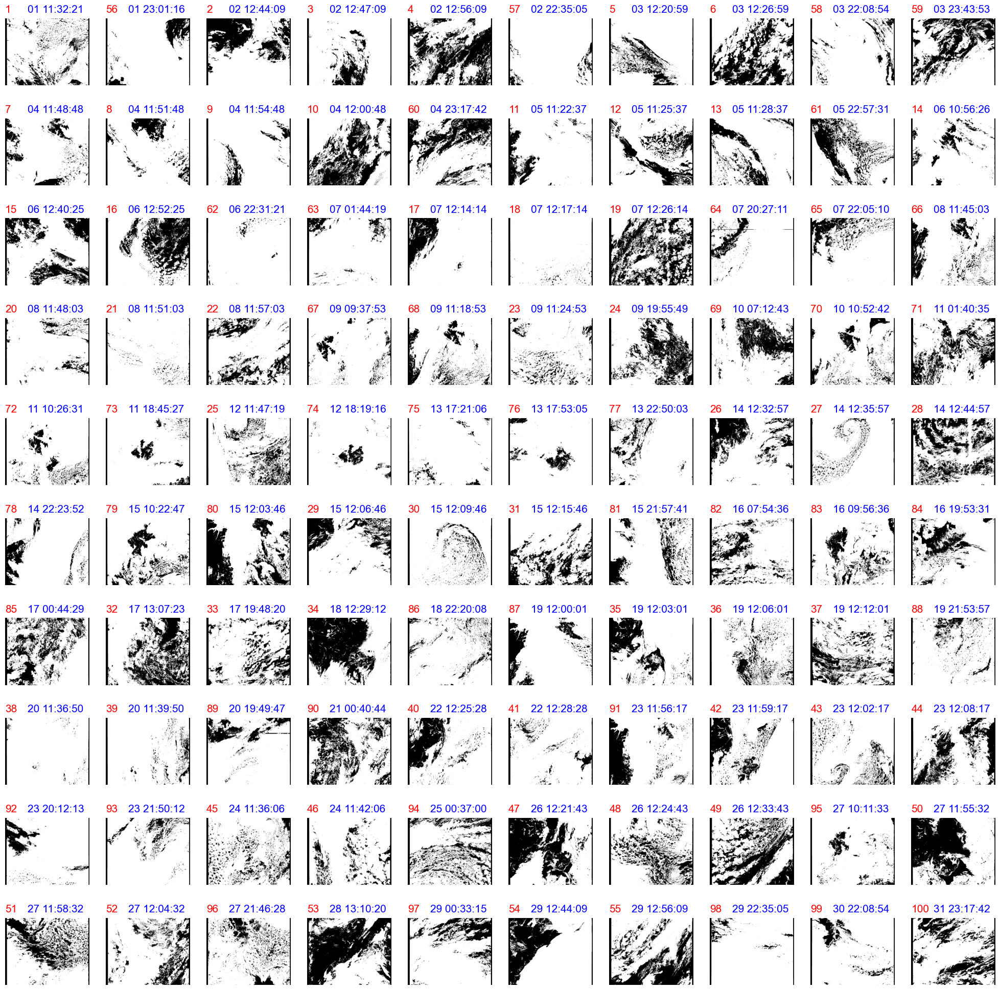

<module 'matplotlib.pyplot' from '/home/green/ENV3/lib/python3.10/site-packages/matplotlib/pyplot.py'>

<Figure size 640x480 with 0 Axes>

In [12]:
sentinel.plot_satelite_matrix(sort_by_time=True, display_time_in_title=True, size=25, fontsize=15, counter_in_title=True, y_offset=-100, dx=400)

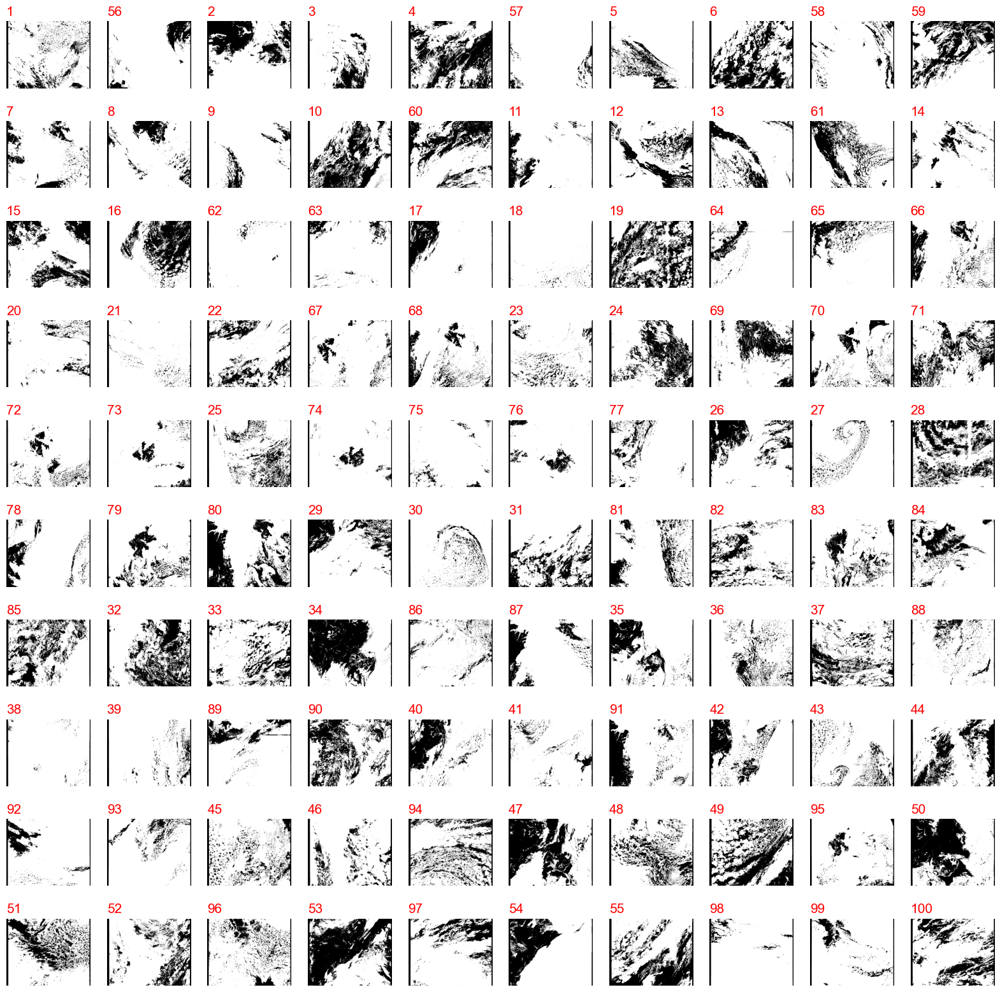

<module 'matplotlib.pyplot' from '/home/green/ENV3/lib/python3.10/site-packages/matplotlib/pyplot.py'>

<Figure size 640x480 with 0 Axes>

In [13]:
sentinel.plot_satelite_matrix(sort_by_time=True, display_time_in_title=False, size=20, y_offset=-100)

# Search & Download using EUMDAC API, from here below

In [26]:
datastore = eumdac.DataStore(token)
selected_collection = datastore.get_collection('EO:EUM:DAT:0615')

In [27]:
def search_SENTINEL3_product(df_entry):
    start_time = df_entry['start_time'].replace(second=0).to_pydatetime()
    start_time = start_time + timedelta(seconds=60)
    stop_time = start_time
    sat_type = None
    
    print('start_time:', start_time)
    
    if df_entry['mission_id']=='S3A':
        sat_type = 'Sentinel-3A'  
    else:
        raise Exception("mission_id (sat_type) unexpected, should be S3A")
    
    products = selected_collection.search(
        dtstart=start_time,
        dtend=stop_time,
        sat=sat_type
    )
    
    if len(products)!=1:
        raise Exception("Error 1: Search finds multiple products.")
        
    selected_product = None
    for product in products:
        try:
            if str(product)[:47]==df_entry['filename'][:47]:
                selected_product = product
                print(product)
                print('Verification Successful.')
            else:
                raise Exception("Error 2: Verfication Failed.")
        except eumdac.collection.CollectionError as error:
            print(f"Error related to the collection: '{error.msg}'")
        except requests.exceptions.ConnectionError as error:
            print(f"Error related to the connection: '{error.msg}'")
        except requests.exceptions.RequestException as error:
            print(f"Unexpected error: {error}")

    return selected_product

In [28]:
# Download two files: browse.jpg (raw image), xfdumanifest.xml (contains longitude, latitude)
def download_additional_data(selected_product, path=f'{DATA_DIR}/ssts-additional-info/'):
    files = ['browse.jpg', str(selected_product)+'/xfdumanifest.xml']
    os.makedirs(path+str(selected_product))
    
    try:
        for file in files:
            with selected_product.open(entry=file) as fsrc, open(path+str(selected_product)+'/'+fsrc.name, mode='wb') as fdst:
                shutil.copyfileobj(fsrc, fdst)
            print(f'Download of file {fsrc.name} finished.')
    except eumdac.product.ProductError as error:
        print(f"Error related to the product '{selected_product}' while trying to download it: '{error.msg}'")
    except requests.exceptions.ConnectionError as error:
        print(f"Error related to the connection: '{error.msg}'")
    except requests.exceptions.RequestException as error:
        print(f"Unexpected error: {error}")

In [29]:
from tqdm import tqdm

dir_exist = False

try:
    os.makedirs(f'{DATA_DIR}/ssts-additional-info/')
except:
    print(f'{DATA_DIR}/ssts-additional-info/',"exists. Terminating downloads...")
    dir_exist = True
    
if not dir_exist:
    # for i in tqdm(range(len(inference_df)), desc="Downloading esat iamges"):
    for i in range(len(inference_df)):
        try:
            # Find all 100 inference satellite image products
            selected_product = search_SENTINEL3_product(inference_df.iloc[i])

            # Download additional files
            download_additional_data(selected_product, f'{DATA_DIR}/ssts-additional-info/')

            print(i, 'completed -------------------------------------------')
        except:
            raise Exception(f"Download is experiencing error at i={i}. Download is completed up to i={i-1}.")


    banner ('SUCCESS')

/nfs/flash/mlcommons/data/ssts-additional-info/ exists. Terminating downloads...


# Extract Geo-Coordinates (Latitude, Longitude), from here below

In [30]:
additional_data_path = f'{DATA_DIR}/ssts-additional-info/'
new_file_list = [file[:47] for file in os.listdir(additional_data_path)]
# new_file_list

In [31]:
def update_dataframe_with_new_filename(dataframe, additional_data_path):
    df = dataframe.copy()
    new_file_list = [file for file in os.listdir(additional_data_path)]
    new_file_list_short = [file[:47] for file in os.listdir(additional_data_path)]
    df['new_filename'] = [None for i in range(len(df))]
    
    for i in range(len(df)):
        for j in range(len(new_file_list_short)):
            if df.iloc[i]['filename'][:47] == new_file_list_short[j]:
                df.loc[i, 'new_filename'] = new_file_list[j]

    return df

In [32]:
def extract_coordinates(dataframe, additional_data_path):
    df = dataframe.copy()
    df['min_latitude'] = [None for i in range(len(df))]
    df['max_latitude'] = [None for i in range(len(df))]
    df['min_longitude'] = [None for i in range(len(df))]
    df['max_longitude'] = [None for i in range(len(df))]

    for i in range(len(df)):
        with open(additional_data_path + df.iloc[i]['new_filename'] + '/xfdumanifest.xml', 'r') as f:
            data = f.read()
        long_str = data.strip().split('gml:posList')[1][1:-2]
        long_list = long_str.strip().split(' ')
        long_list = [float(coor) for coor in long_list]
        list1 = long_list[::2]
        list2 = long_list[1::2]
        
        df.loc[i, 'min_latitude'] = min(list1)
        df.loc[i, 'max_latitude'] = max(list1)
        df.loc[i, 'min_longitude'] = min(list2)
        df.loc[i, 'max_longitude'] = max(list2)
        
    return df

In [33]:
# thsi is wrong files must all be relative to esat and data_dir or . ? maybe ok if we document better

inference_df = update_dataframe_with_new_filename(inference_df, f'{DATA_DIR}/ssts-additional-info/')
inference_df = extract_coordinates(inference_df, f'{DATA_DIR}/ssts-additional-info/')
inference_df

,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,...,instance_id,center_id,class_id,file_extension,hdf_file,new_filename,min_latitude,max_latitude,min_longitude,max_longitude
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,...,0179_050_023_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191001T113221_20191001T11352...,49.3736,62.9199,-27.3277,1.10981
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,...,0180_050_038_1800,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124409_20191002T12470...,59.3336,73.3693,-44.6162,-4.17663
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,...,0179_050_038_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124709_20191002T12500...,49.3902,62.9367,-46.0283,-17.5778
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,...,0179_050_038_2520,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T125609_20191002T12590...,18.1641,31.4999,-51.0993,-34.0545
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,...,0179_050_052_1980,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191003T122059_20191003T12235...,49.3862,62.9326,-39.4834,-11.0361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,...,0179_051_015_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191027T214628_20191027T21492...,51.3203,64.9458,-23.332,6.80277
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,...,0179_051_031_0360,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T003315_20191029T00361...,20.1914,33.5177,-49.4951,-32.1538
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,...,0179_051_044_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T223505_20191029T22380...,51.3303,64.9386,-35.4784,-5.35265
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,...,0179_051_058_0900,LN2,O_NT_003,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191030T220854_20191030T22115...,51.3245,64.9323,-28.9257,1.19417


In [34]:
# Function to calculate Haversine distance
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # Radius of Earth in kilometers

    dlat = np.radians(lat2 - lat1)
    dlon = np.radians(lon2 - lon1)

    a = np.sin(dlat/2) * np.sin(dlat/2) + np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(dlon/2) * np.sin(dlon/2)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))

    distance = R * c  # Distance in kilometers

    # Area of a rectangle on the Earth's surface
    area = distance * distance

    return area

inference_df['area'] = inference_df.apply(lambda row: haversine(row['min_latitude'], row['min_longitude'], row['max_latitude'], row['max_longitude']), axis=1)


inference_df['d_latitude'] = inference_df['max_latitude'] - inference_df['min_latitude']
inference_df['d_longitude'] = inference_df['max_longitude'] - inference_df['min_longitude']

inference_df

,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,...,file_extension,hdf_file,new_filename,min_latitude,max_latitude,min_longitude,max_longitude,area,d_latitude,d_longitude
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191001T113221_20191001T11352...,49.3736,62.9199,-27.3277,1.10981,5.217462e+06,13.5463,28.43751
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124409_20191002T12470...,59.3336,73.3693,-44.6162,-4.17663,5.312405e+06,14.0357,40.43957
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124709_20191002T12500...,49.3902,62.9367,-46.0283,-17.5778,5.217480e+06,13.5465,28.4505
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T125609_20191002T12590...,18.1641,31.4999,-51.0993,-34.0545,5.131625e+06,13.3358,17.0448
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191003T122059_20191003T12235...,49.3862,62.9326,-39.4834,-11.0361,5.217449e+06,13.5464,28.4473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191027T214628_20191027T21492...,51.3203,64.9458,-23.332,6.80277,5.244646e+06,13.6255,30.13477
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T003315_20191029T00361...,20.1914,33.5177,-49.4951,-32.1538,5.126915e+06,13.3263,17.3413
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T223505_20191029T22380...,51.3303,64.9386,-35.4784,-5.35265,5.237199e+06,13.6083,30.12575
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191030T220854_20191030T22115...,51.3245,64.9323,-28.9257,1.19417,5.236970e+06,13.6078,30.11987


/tmp/ipykernel_359254/817809240.py:18: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


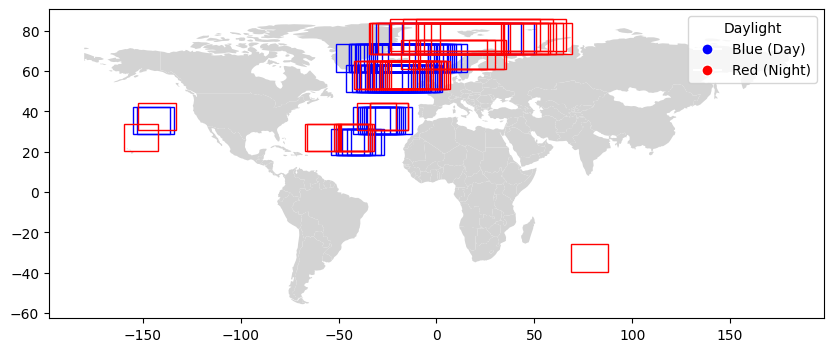

In [35]:
df = inference_df

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy((df.min_longitude + df.max_longitude) / 2, (df.min_latitude + df.max_latitude) / 2))

gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'


# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"
# gdf.crs = "EPSG:3395" # Mercator
# gdf.crs = "EPSG:3857"


bounds = gdf.total_bounds

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world.cx[bounds[0]:bounds[2], bounds[1]:bounds[3]].plot(figsize=(10, 5), color='lightgrey')
# gdf.plot(ax=ax, marker='o', color='red', markersize=50)

from matplotlib.patches import Rectangle

for index, row in gdf.iterrows():
    rect = Rectangle((row['min_longitude'], row['min_latitude']),
                     row['max_longitude'] - row['min_longitude'],
                     row['max_latitude'] - row['min_latitude'],
                     edgecolor=row['color'], facecolor='none')
    ax.add_patch(rect)


# Add legend
legend_labels = {'day': 'Blue (Day)', 'night': 'Red (Night)'}
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label=legend_labels['day']),
                  plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label=legend_labels['night'])]

ax.legend(handles=legend_handles, title='Daylight', loc='upper right')

# save_plot(plt, "images/inference-frames", dpi=300)


plt.savefig("images/inference-frames.png")
plt.show()

In [36]:
gdf

,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,...,new_filename,min_latitude,max_latitude,min_longitude,max_longitude,area,d_latitude,d_longitude,geometry,color
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191001T113221_20191001T11352...,49.3736,62.9199,-27.3277,1.10981,5.217462e+06,13.5463,28.43751,POINT (-13.10895 56.14675),blue
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191002T124409_20191002T12470...,59.3336,73.3693,-44.6162,-4.17663,5.312405e+06,14.0357,40.43957,POINT (-24.39642 66.35145),blue
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191002T124709_20191002T12500...,49.3902,62.9367,-46.0283,-17.5778,5.217480e+06,13.5465,28.4505,POINT (-31.80305 56.16345),blue
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191002T125609_20191002T12590...,18.1641,31.4999,-51.0993,-34.0545,5.131625e+06,13.3358,17.0448,POINT (-42.57690 24.83200),blue
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191003T122059_20191003T12235...,49.3862,62.9326,-39.4834,-11.0361,5.217449e+06,13.5464,28.4473,POINT (-25.25975 56.15940),blue
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191027T214628_20191027T21492...,51.3203,64.9458,-23.332,6.80277,5.244646e+06,13.6255,30.13477,POINT (-8.26462 58.13305),red
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191029T003315_20191029T00361...,20.1914,33.5177,-49.4951,-32.1538,5.126915e+06,13.3263,17.3413,POINT (-40.82445 26.85455),red
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191029T223505_20191029T22380...,51.3303,64.9386,-35.4784,-5.35265,5.237199e+06,13.6083,30.12575,POINT (-20.41552 58.13445),red
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,...,S3A_SL_1_RBT____20191030T220854_20191030T22115...,51.3245,64.9323,-28.9257,1.19417,5.236970e+06,13.6078,30.11987,POINT (-13.86576 58.12840),red


/tmp/ipykernel_359254/2142380745.py:17: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


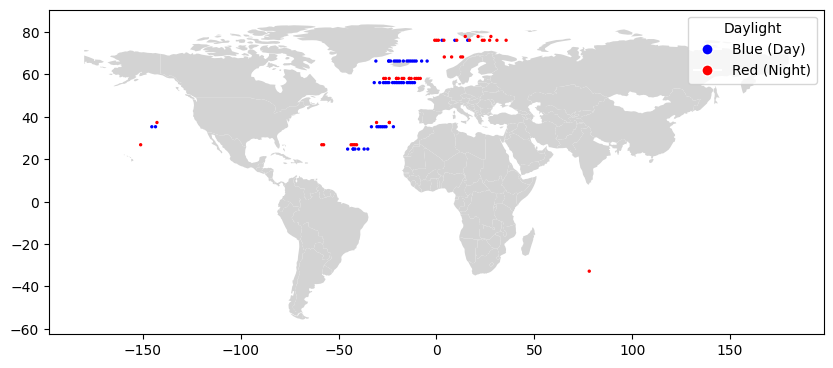

In [37]:

import matplotlib.pyplot as plt

# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

bounds = gdf.total_bounds

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world.cx[bounds[0]:bounds[2], bounds[1]:bounds[3]].plot(figsize=(10, 5), color='lightgrey')
gdf.plot(ax=ax, marker='o', color=gdf['color'], markersize=2)

# Add legend
legend_labels = {'day': 'Blue (Day)', 'night': 'Red (Night)'}
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label=legend_labels['day']),
                  plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label=legend_labels['night'])]

ax.legend(handles=legend_handles, title='Daylight', loc='upper right')

plt.savefig("images/inference-dots")

plt.show()

/tmp/ipykernel_359254/2231805759.py:18: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


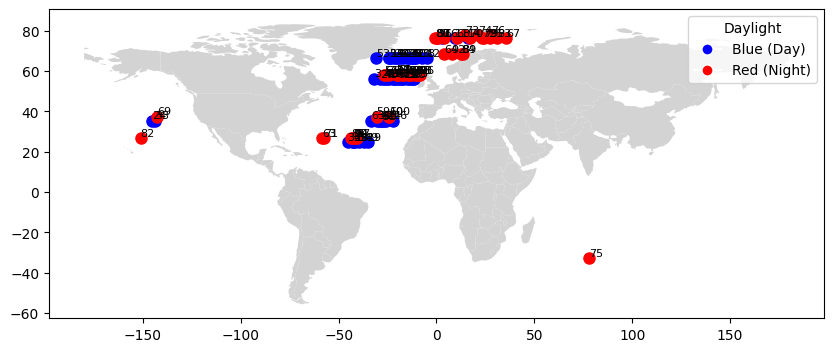

In [38]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

bounds = gdf.total_bounds

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

ax = world.cx[bounds[0]:bounds[2], bounds[1]:bounds[3]].plot(figsize=(10, 5), color='lightgrey')

# Plot markers on the map and add counter values
for index, row in gdf.iterrows():
    ax.plot(row['geometry'].x, row['geometry'].y, marker='o', color=row['color'], markersize=8)
    ax.text(row['geometry'].x, row['geometry'].y, str(row['counter']), fontsize=8, ha='left', va='bottom')

# Add legend
legend_labels = {'day': 'Blue (Day)', 'night': 'Red (Night)'}
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label=legend_labels['day']),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label=legend_labels['night'])
]

ax.legend(handles=legend_handles, title='Daylight', loc='upper right')

plt.show()


In [39]:
import folium
from folium.plugins import MarkerCluster

# Assuming you already have the GeoDataFrame gdf

def data_string(data, values):
    s = ""
    for v in values:
        s = s + f"{v}: {data[v]}\n"
    return s

def set_folium_title(mymap, title):
    title_html = f'''
    <h3 style="text-align:center;">{title}</h3>
    '''
    mymap.get_root().html.add_child(folium.Element(title_html))

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center, zoom_start=0)

# Add a Marker Cluster to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    marker_color = 'blue' if row['daylight'] == 'day' else 'red'
    folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=data_string(row, ["counter", "daylight", "min_latitude", "max_latitude", "min_latitude", "max_latitude"]),
        icon=folium.Icon(color=marker_color),
    ).add_to(marker_cluster)

# Add satellite imagery tile layer
tile = folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Esri Satellite',
    overlay=False,
    control=True
).add_to(mymap)

set_folium_title(mymap, "Satellite Map with Image Locations used in Inference & Data as Popup")

mymap.fit_bounds(mymap.get_bounds())
mymap


In [40]:
import folium
from folium.plugins import MarkerCluster

# Assuming you already have the GeoDataFrame gdf

def data_string(data, values):
    s = ""
    for v in values:
        s = s + f"{v}: {data[v]}\n"
    return s

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center, zoom_start=0)

# Add a Marker Cluster to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    marker_color = 'blue' if row['daylight'] == 'day' else 'red'
    folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=data_string(row, ["counter", "daylight", "min_latitude", "max_latitude", "min_latitude", "max_latitude"]),
        icon=folium.Icon(color=marker_color),
    ).add_to(marker_cluster)

    folium.vector_layers.Rectangle(
        bounds=[(row['min_latitude'], row['min_longitude']), (row['max_latitude'], row['max_longitude'])],
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.2,
        popup=f"Area: {data_string(row, ['min_latitude', 'max_latitude', 'min_longitude', 'max_longitude'])}",
    ).add_to(mymap)

tile = folium.TileLayer(
        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True
       ).add_to(mymap)

set_folium_title(mymap, "Satellite Map with Image Frames used in Inference & Data as Popup")

mymap.fit_bounds(mymap.get_bounds())
mymap


In [41]:
folium.__version__

'0.15.1'

In [42]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center, zoom_start=5)

# Add a Marker Cluster to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=str(row['counter']),
        icon=folium.Icon(color=row['color']),
    ).add_to(marker_cluster)

# Add legend
legend_html = f'''
<div style="position: fixed; top: 50px; right: 50px; z-index: 1000; background-color:white; padding: 10px; border: 1px solid grey; border-radius: 5px;">
    <p><strong>Legend</strong></p>
    <p><i class="fas fa-circle" style="color: blue;"></i> Day</p>
    <p><i class="fas fa-circle" style="color: red;"></i> Night</p>
</div>
'''
mymap.get_root().html.add_child(folium.Element(legend_html))

set_folium_title(mymap, "Map with Image Locations used in Inference & Data as Popup")

mymap.fit_bounds(mymap.get_bounds())
mymap


In [43]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center)

# Add a Marker Cluster to the map
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    circle_marker = folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        #radius=5,  # Adjust the radius as needed
        popup=str(row['counter']),
        #color=row['color'],
        #fill=True,
        #fill_color=row['color'],
        #fill_opacity=1.0,
        icon=folium.DivIcon(html=f"<div style='font-size: 12px; color: {row['color']}'>{row['counter']}</div>"
        )
    )
    marker_cluster.add_child(circle_marker)

# Add legend
legend_html = f'''
<div style="position: fixed; top: 50px; right: 50px; z-index: 1000; background-color:white; padding: 10px; border: 1px solid grey; border-radius: 5px;">
    <p><strong>Legend</strong></p>
    <p><i class="fas fa-circle" style="color: blue;"></i> Day</p>
    <p><i class="fas fa-circle" style="color: red;"></i> Night</p>
</div>
'''
mymap.get_root().html.add_child(folium.Element(legend_html))

mymap.fit_bounds(mymap.get_bounds())

set_folium_title(mymap, "Map with Image Location Counter when Zoomed in used in Inference & Data as Popup")

# Display the map
mymap


In [44]:
import geopandas as gpd
import folium

fontsize = 6
# Assuming you already have the DataFrame df
# ...

# Assuming df.daylight is a column in your DataFrame
# If it's not, replace df.daylight with the correct column name
gdf['color'] = 'blue'
gdf.loc[df['daylight'] != 'day', 'color'] = 'red'

# Set the coordinate reference system (CRS)
# Note: The CRS should match the coordinate system of the latitude and longitude values
gdf.crs = "EPSG:4326"

# Create a Folium Map centered around the mean latitude and longitude
map_center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
mymap = folium.Map(location=map_center, zoom_start=5)

# Add markers for each point in the GeoDataFrame
for idx, row in gdf.iterrows():
    circle_marker = folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],
        popup=str(row['counter']),
        icon=folium.DivIcon(html=f"<div style='font-size: {fontsize}px; color: {row['color']}'>{row['counter']}</div>"
        )
    )
    circle_marker.add_to(mymap)

# Add legend
legend_html = f'''
<div style="position: fixed; top: 50px; right: 50px; z-index: 1000; background-color:white; padding: 10px; border: 1px solid grey; border-radius: 5px;">
    <p><strong>Legend</strong></p>
    <p><i class="fas fa-circle" style="color: blue;"></i> Day</p>
    <p><i class="fas fa-circle" style="color: red;"></i> Night</p>
</div>
'''
mymap.get_root().html.add_child(folium.Element(legend_html))

set_folium_title(mymap, "Map with Image Location Counter used in Inference & Data as Popup")

mymap.fit_bounds(mymap.get_bounds())

# Display the map in Jupyter Notebook
plt.show()

# Save the Matplotlib plot as an image
plt.savefig('folium_map_screenshot.png', bbox_inches='tight', pad_inches=0.1)


mymap


<Figure size 640x480 with 0 Axes>

In [45]:
plt.savefig("images/inference-satelite")

<Figure size 640x480 with 0 Axes>

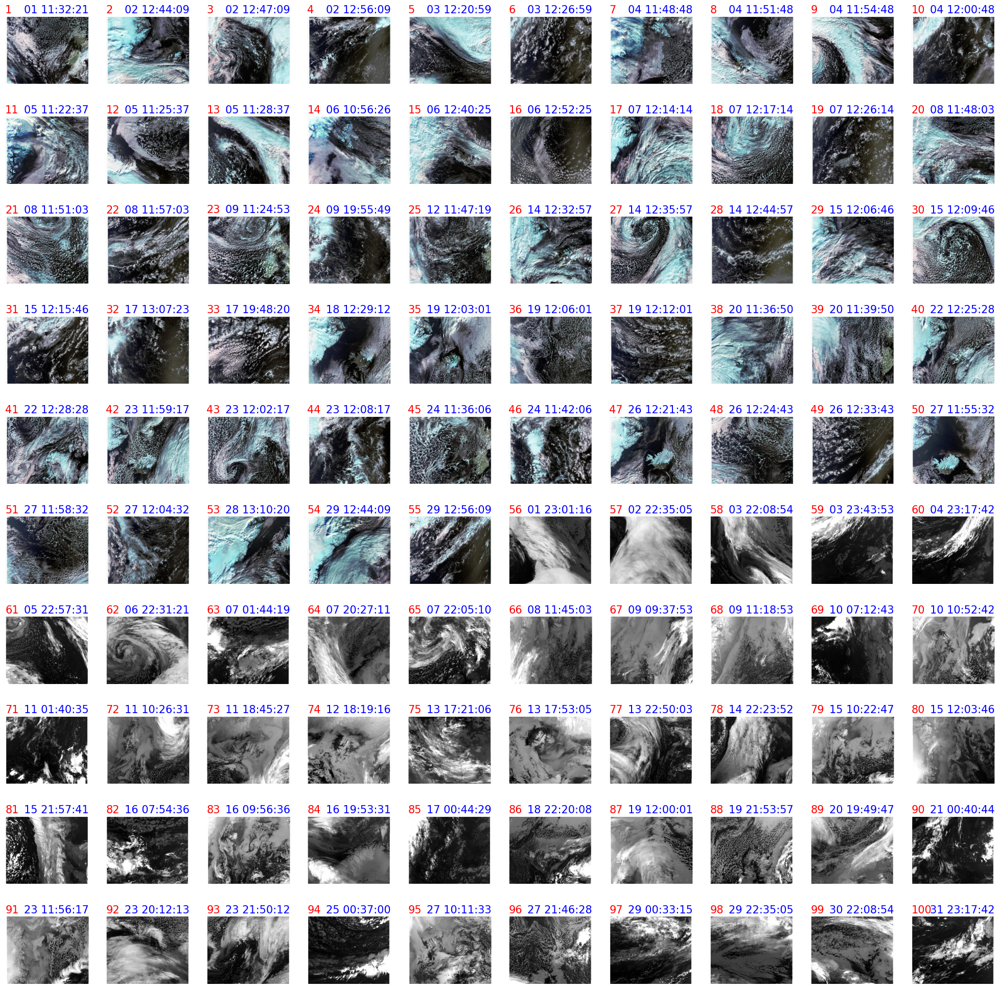

In [46]:
import matplotlib.pyplot as plt
import matplotlib.image as img


def plot_image_matrix(dataframe, additional_data_path=None, image_name='/browse.jpg', sort_by_time=False, display_time_in_title=False, size=15, fontsize=15, x_offset=0, y_offset=0, dx=100, counter_in_title=True, filename="images/raw_inference_image_matrix.png"):
    if sort_by_time:
        dataframe = dataframe.sort_values(by=['start_time'])


    fig, axs = plt.subplots(10, 10, figsize=(size, size))
    for i in range(100):
        image = img.imread(additional_data_path + dataframe.iloc[i]['new_filename'] + image_name)
        row, col = divmod(i, 10)
        axs[row][col].imshow(image)

        if counter_in_title:
            label = str(dataframe.iloc[i]['counter'])
            axs[row][col].text(x_offset, y_offset, label, color='red', fontsize=fontsize)

        if display_time_in_title:
            # time = dataframe.iloc[i]['start_time'].strftime('%Y-%m-%d %H:%M:%S')
            label = dataframe.iloc[i]['start_time'].strftime('%d %H:%M:%S')
            axs[row][col].text(x_offset + dx, y_offset, label, color='blue', fontsize=fontsize)

        axs[row][col].axis('off')

    # plt.show()
    plt.savefig('raw_inference_image_matrix.png', dpi=500)

plot_image_matrix(inference_df, additional_data_path=f'{DATA_DIR}/ssts-additional-info/', size=25, y_offset=-20, counter_in_title=True, display_time_in_title=True)

In [55]:
inference_df


,counter,daylight,start_time,stop_time,dt_m,filename,mission_id,data_source,processing_level,data_type_id,...,file_extension,hdf_file,new_filename,min_latitude,max_latitude,min_longitude,max_longitude,area,d_latitude,d_longitude
0,1,day,2019-10-01 11:32:21,2019-10-01 11:35:21,3.0,S3A_SL_1_RBT____20191001T113221_20191001T11352...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191001T113221_20191001T11352...,49.3736,62.9199,-27.3277,1.10981,5.217462e+06,13.5463,28.43751
1,2,day,2019-10-02 12:44:09,2019-10-02 12:47:09,3.0,S3A_SL_1_RBT____20191002T124409_20191002T12470...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124409_20191002T12470...,59.3336,73.3693,-44.6162,-4.17663,5.312405e+06,14.0357,40.43957
2,3,day,2019-10-02 12:47:09,2019-10-02 12:50:09,3.0,S3A_SL_1_RBT____20191002T124709_20191002T12500...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T124709_20191002T12500...,49.3902,62.9367,-46.0283,-17.5778,5.217480e+06,13.5465,28.4505
3,4,day,2019-10-02 12:56:09,2019-10-02 12:59:09,3.0,S3A_SL_1_RBT____20191002T125609_20191002T12590...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191002T125609_20191002T12590...,18.1641,31.4999,-51.0993,-34.0545,5.131625e+06,13.3358,17.0448
4,5,day,2019-10-03 12:20:59,2019-10-03 12:23:59,3.0,S3A_SL_1_RBT____20191003T122059_20191003T12235...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191003T122059_20191003T12235...,49.3862,62.9326,-39.4834,-11.0361,5.217449e+06,13.5464,28.4473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,night,2019-10-27 21:46:28,2019-10-27 21:49:28,3.0,S3A_SL_1_RBT____20191027T214628_20191027T21492...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191027T214628_20191027T21492...,51.3203,64.9458,-23.332,6.80277,5.244646e+06,13.6255,30.13477
96,97,night,2019-10-29 00:33:15,2019-10-29 00:36:15,3.0,S3A_SL_1_RBT____20191029T003315_20191029T00361...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T003315_20191029T00361...,20.1914,33.5177,-49.4951,-32.1538,5.126915e+06,13.3263,17.3413
97,98,night,2019-10-29 22:35:05,2019-10-29 22:38:05,3.0,S3A_SL_1_RBT____20191029T223505_20191029T22380...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191029T223505_20191029T22380...,51.3303,64.9386,-35.4784,-5.35265,5.237199e+06,13.6083,30.12575
98,99,night,2019-10-30 22:08:54,2019-10-30 22:11:54,3.0,S3A_SL_1_RBT____20191030T220854_20191030T22115...,S3A,SL,1,RBT,...,hdf,"[bayes, bts, rads, refs, summary]",S3A_SL_1_RBT____20191030T220854_20191030T22115...,51.3245,64.9323,-28.9257,1.19417,5.236970e+06,13.6078,30.11987


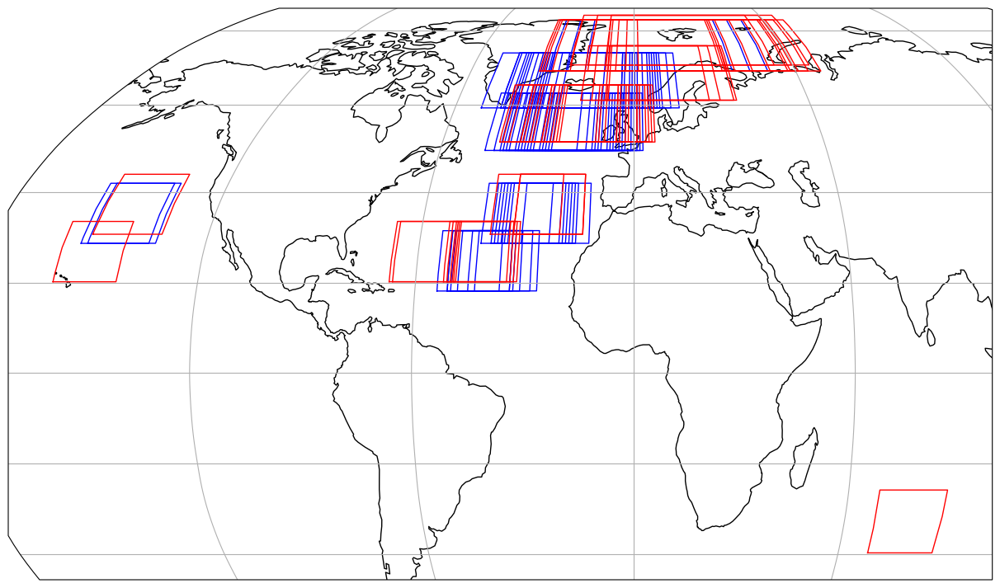

In [156]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_rectangles_on_projection(df, scale=3, projection=ccrs.Robinson()):
    
    # Create a figure and axis with Robinson projection
    fig, ax = plt.subplots(figsize=(scale * 5.12985642927, scale * 3), subplot_kw={'projection': projection})

    # Add coastlines and gridlines
    ax.coastlines(resolution='110m')
    ax.gridlines()

    # Create an instance of the Robinson projection
    robinson_proj = ccrs.Robinson()

    # Plot rectangles for each area
    for index, row in df.iterrows():
        min_lat, max_lat = row['min_latitude'], row['max_latitude']
        min_lon, max_lon = row['min_longitude'], row['max_longitude']
        daylight = row['daylight']

        # Determine the color based on daylight
        color = 'blue' if daylight == 'day' else 'red'

        # Plot lines to form a rectangle
        ax.plot([min_lon, max_lon, max_lon, min_lon, min_lon], [min_lat, min_lat, max_lat, max_lat, min_lat],
                color=color, linewidth=1, transform=ccrs.PlateCarree())

    # Set aspect ratio manually
    ax.set_aspect('auto')

    # Show the plot
    plt.show()


# Call the function with your DataFrame
plot_rectangles_on_projection(inference_df, projection=ccrs.Robinson())


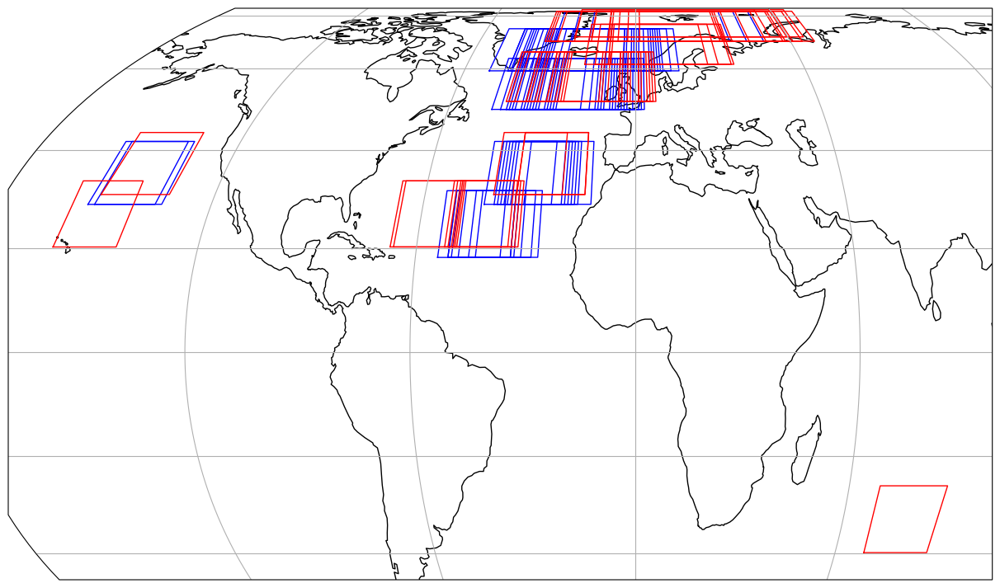

In [157]:
plot_rectangles_on_projection(inference_df, projection=ccrs.EqualEarth())

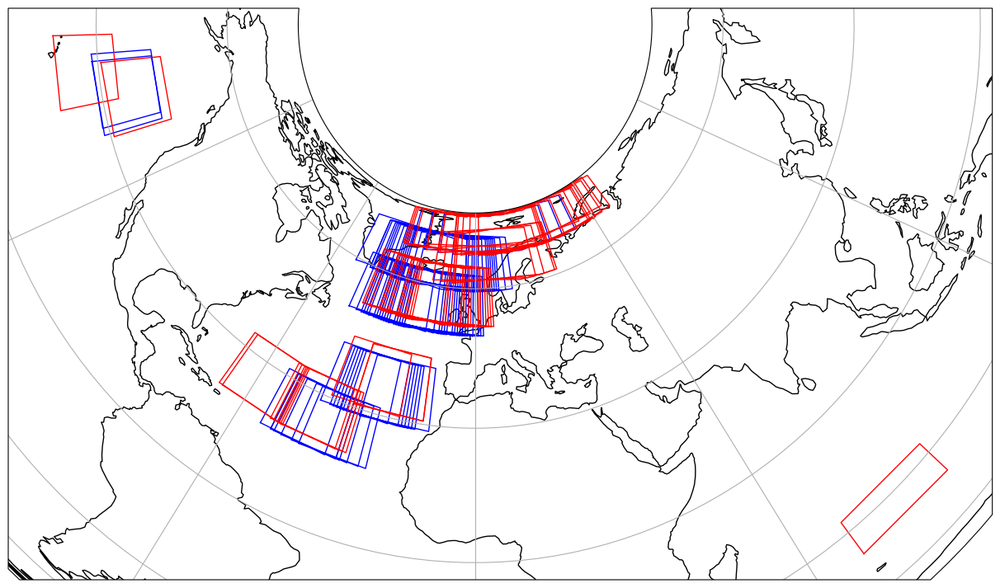

In [158]:
plot_rectangles_on_projection(inference_df, projection=ccrs.AlbersEqualArea())

In [159]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.AzimuthalEquidistant())

In [160]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.LambertConformal())

In [161]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.LambertCylindrical())

In [162]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.LambertAzimuthalEqualArea())

In [163]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.Mercator())

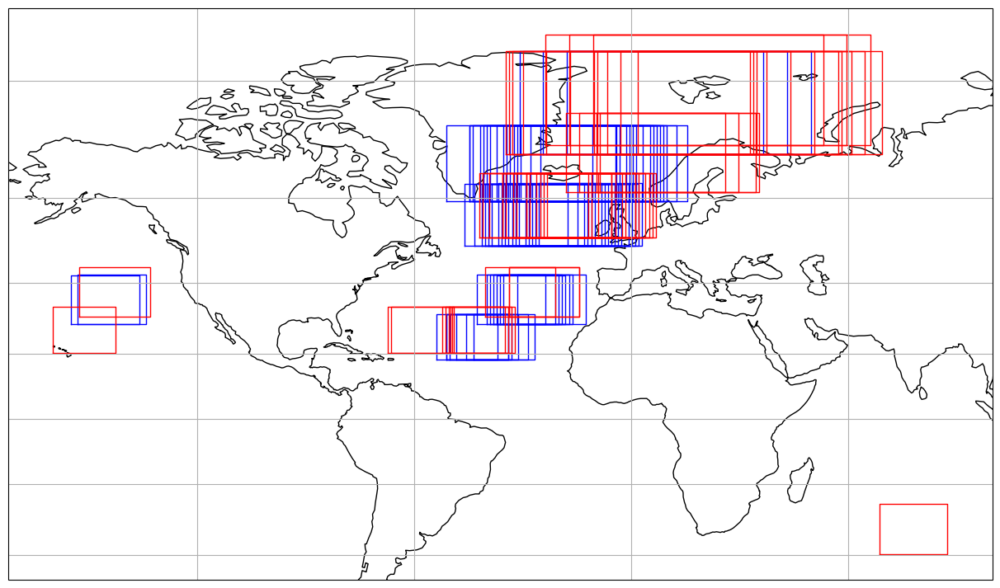

In [164]:
plot_rectangles_on_projection(inference_df, projection=ccrs.Miller())

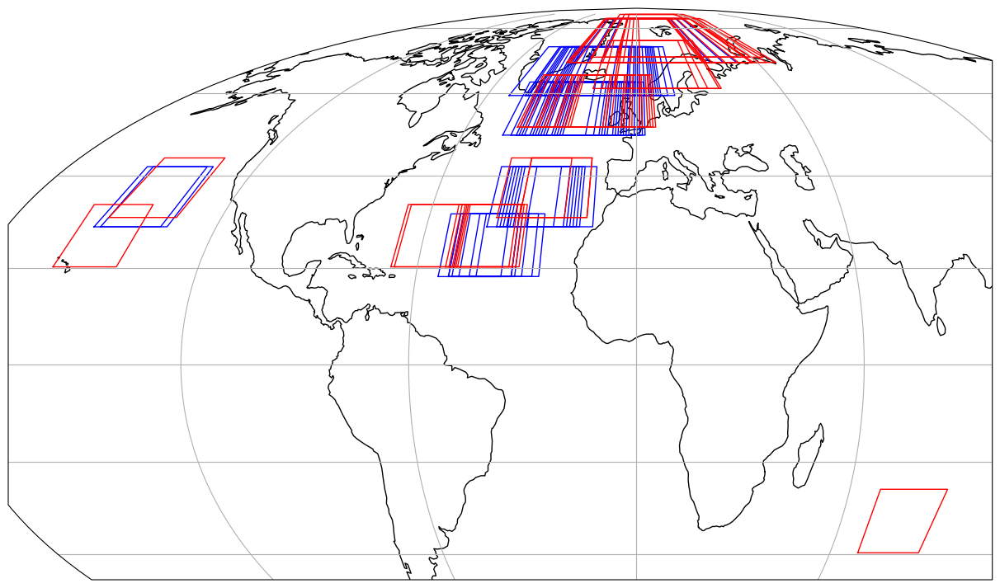

In [165]:
plot_rectangles_on_projection(inference_df, projection=ccrs.Mollweide())

In [166]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.Orthographic())

In [167]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.Sinusoidal())

In [168]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.Stereographic())

In [169]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.TransverseMercator())

In [170]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.InterruptedGoodeHomolosine())

In [171]:
# plot_rectangles_on_projection(inference_df, projection=ccrs.NearsidePerspective())